<a href="https://colab.research.google.com/github/frankssenoga/data-mining/blob/main/Explainable_Cloud_Forensics_for_VM_in_Heterogeneous_Distributed_Data_Centers_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [104]:
!pip install numpy

In [106]:
!pip install scipy --upgrade


In [107]:
pip install tf-keras-vis

In [108]:
!pip install --upgrade shap

In [109]:
!pip install lime

In [110]:
!pip install shap

In [111]:
!pip install --upgrade scikit-learn

In [112]:
!pip install captum

In [113]:
from google.colab import drive

In [114]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [115]:
import shap
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.ndimage import gaussian_filter1d  # For smoothing
import pandas as pd
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Conv1D, BatchNormalization, ReLU, Dropout, Flatten, Dense, Input, Add
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.layers import Input, Dense, LSTM, MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling1D # Import GlobalAveragePooling1D
from tensorflow.keras.layers import GlobalAveragePooling1D # Import GlobalAveragePooling1D
import seaborn as sns
from sklearn.neural_network import MLPClassifier
from imblearn.combine import SMOTETomek
import warnings
from sklearn.pipeline import make_pipeline  # Import make_pipeline
from sklearn.preprocessing import StandardScaler
from tensorflow.keras import layers, models # Import layers and models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings("ignore")
from tensorflow.keras.layers import Attention
from imblearn.combine import SMOTETomek
import lime.lime_tabular
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

In [116]:
df=pd.read_csv('/content/drive/MyDrive/ML DATASETS/kvm.csv')
df

,LAST_POLL,VMID,UUID,dom,rxbytes,rxpackets,rxerrors,rxdrops,txbytes,txpackets,...,vdard_bytes,vdawr_reqs,vdawr_bytes,vdaerror,hdard_req,hdard_bytes,hdawr_reqs,hdawr_bytes,hdaerror,Status
0,1604406033,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,36199,606,0,0,2.108000e+03,32,...,176581632,3475,37070336,-1,148,506260,0,0,-1,Normal
1,1604406062,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,37039,622,0,0,2.240000e+03,34,...,176581632,3521,37385728,-1,148,506260,0,0,-1,Normal
2,1604406092,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,37969,639,0,0,2.372000e+03,36,...,176581632,3684,39052800,-1,148,506260,0,0,-1,Normal
3,1604406122,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,38809,655,0,0,2.372000e+03,36,...,176581632,3714,39269888,-1,148,506260,0,0,-1,Normal
4,1604406153,7,"""2bc1fde1-28d9-454e-8029-21a138714234""",one-33,39589,670,0,0,2.442000e+03,37,...,176581632,3831,40703488,-1,148,506260,0,0,-1,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9605,1604635532,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,249706534,224881,0,0,1.290000e+11,742023775,...,737603584,89969,3187705344,-1,229,766668,0,0,-1,Attack
9606,1604635562,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,249707356,224897,0,0,1.290000e+11,742666481,...,737603584,89982,3187807744,-1,229,766668,0,0,-1,Attack
9607,1604635592,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,249708178,224913,0,0,1.290000e+11,743078195,...,737603584,90001,3187901952,-1,229,766668,0,0,-1,Attack
9608,1604635622,6,cf1325c0-957a-4744-8912-377f3f477971,one-43,249709000,224929,0,0,1.290000e+11,743699492,...,737603584,90001,3187901952,-1,229,766668,0,0,-1,Attack


In [117]:
# viewing summary statistics
df.describe()

,LAST_POLL,VMID,rxbytes,rxpackets,rxerrors,rxdrops,txbytes,txpackets,txerrors,txdrops,...,vdard_req,vdard_bytes,vdawr_reqs,vdawr_bytes,vdaerror,hdard_req,hdard_bytes,hdawr_reqs,hdawr_bytes,hdaerror
count,9.610000e+03,9610.000000,9.610000e+03,9610.000000,9610.0,9610.0,9.610000e+03,9.610000e+03,9610.0,9610.0,...,9610.000000,9.610000e+03,9610.000000,9.610000e+03,9610.0,9610.000000,9.610000e+03,9610.0,9610.0,9610.0
mean,1.604483e+09,7.547555,1.072351e+08,110013.844849,0.0,0.0,7.861332e+09,4.520014e+07,0.0,0.0,...,11863.568678,4.716651e+08,55811.039958,2.071690e+09,-1.0,158.909886,5.417765e+05,0.0,0.0,-1.0
std,8.161554e+04,1.734985,8.879990e+07,112716.334515,0.0,0.0,2.484470e+10,1.427949e+08,0.0,0.0,...,6003.358633,2.054412e+08,22482.173934,3.392400e+09,0.0,26.728551,8.603470e+04,0.0,0.0,0.0
min,1.604406e+09,1.000000,6.067000e+03,58.000000,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,...,5226.000000,1.363384e+08,95.000000,8.821760e+05,-1.0,114.000000,3.894640e+05,0.0,0.0,-1.0
25%,1.604424e+09,6.000000,7.475850e+07,62245.000000,0.0,0.0,1.943536e+06,2.343000e+04,0.0,0.0,...,8442.000000,3.992975e+08,46227.000000,7.079400e+08,-1.0,148.000000,5.062600e+05,0.0,0.0,-1.0
50%,1.604442e+09,8.000000,8.122595e+07,71284.000000,0.0,0.0,2.304449e+06,3.019000e+04,0.0,0.0,...,8872.000000,4.204657e+08,60145.000000,8.248806e+08,-1.0,148.000000,5.062600e+05,0.0,0.0,-1.0
75%,1.604589e+09,9.000000,8.456553e+07,81431.250000,0.0,0.0,3.400618e+06,4.051800e+04,0.0,0.0,...,15628.000000,5.196206e+08,65383.250000,1.666242e+09,-1.0,148.000000,5.062600e+05,0.0,0.0,-1.0
max,1.604636e+09,10.000000,2.900588e+08,523553.000000,0.0,0.0,1.290000e+11,7.442514e+08,0.0,0.0,...,25232.000000,9.733345e+08,106631.000000,1.781456e+10,-1.0,332.000000,1.076472e+06,0.0,0.0,-1.0


In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9610 entries, 0 to 9609
Data columns (total 44 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   LAST_POLL           9610 non-null   int64  
 1   VMID                9610 non-null   int64  
 2   UUID                9610 non-null   object 
 3   dom                 9610 non-null   object 
 4   rxbytes             9610 non-null   int64  
 5   rxpackets           9610 non-null   int64  
 6   rxerrors            9610 non-null   int64  
 7   rxdrops             9610 non-null   int64  
 8   txbytes             9610 non-null   float64
 9   txpackets           9610 non-null   int64  
 10  txerrors            9610 non-null   int64  
 11  txdrops             9610 non-null   int64  
 12  timecpu             9610 non-null   float64
 13  timesys             9610 non-null   float64
 14  timeusr             9610 non-null   float64
 15  state               9610 non-null   int64  
 16  memmax

In [119]:
# Detecting if there are missing values in the dataset
df.isnull().sum()

,0
LAST_POLL,0
VMID,0
UUID,0
dom,0
rxbytes,0
rxpackets,0
rxerrors,0
rxdrops,0
txbytes,0
txpackets,0


In [120]:
# Removing irrelevant columns from the dataset
df= df.drop(['UUID','rxerrors','rxdrops','txerrors','txdrops','memmax','mem','cpus','memactual','memswap_in','memswap_out','memmajor_fault','memavailable','memdisk_cache','memhugetlb_pgalloc','memhugetlb_pgfail','vdaerror','hdawr_reqs','hdawr_bytes','hdaerror'],axis =1)
df = df.dropna()

In [121]:
df

,LAST_POLL,VMID,dom,rxbytes,rxpackets,txbytes,txpackets,timecpu,timesys,timeusr,...,memusable,memlast_update,memrss,vdard_req,vdard_bytes,vdawr_reqs,vdawr_bytes,hdard_req,hdard_bytes,Status
0,1604406033,7,one-33,36199,606,2.108000e+03,32,1.020000e+12,6.070000e+09,4.420000e+09,...,603072,1604405004,480732,5896,176581632,3475,37070336,148,506260,Normal
1,1604406062,7,one-33,37039,622,2.240000e+03,34,1.040000e+12,6.120000e+09,4.450000e+09,...,603072,1604405004,480732,5896,176581632,3521,37385728,148,506260,Normal
2,1604406092,7,one-33,37969,639,2.372000e+03,36,1.060000e+12,6.190000e+09,4.490000e+09,...,603072,1604405004,480984,5896,176581632,3684,39052800,148,506260,Normal
3,1604406122,7,one-33,38809,655,2.372000e+03,36,1.080000e+12,6.240000e+09,4.550000e+09,...,603072,1604405004,480984,5896,176581632,3714,39269888,148,506260,Normal
4,1604406153,7,one-33,39589,670,2.442000e+03,37,1.100000e+12,6.320000e+09,4.620000e+09,...,603072,1604405004,480880,5896,176581632,3831,40703488,148,506260,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9605,1604635532,6,one-43,249706534,224881,1.290000e+11,742023775,4.790000e+13,1.450000e+13,4.760000e+12,...,603132,1604587567,822896,20509,737603584,89969,3187705344,229,766668,Attack
9606,1604635562,6,one-43,249707356,224897,1.290000e+11,742666481,4.800000e+13,1.460000e+13,4.760000e+12,...,603132,1604587567,822896,20509,737603584,89982,3187807744,229,766668,Attack
9607,1604635592,6,one-43,249708178,224913,1.290000e+11,743078195,4.800000e+13,1.460000e+13,4.760000e+12,...,603132,1604587567,822884,20509,737603584,90001,3187901952,229,766668,Attack
9608,1604635622,6,one-43,249709000,224929,1.290000e+11,743699492,4.800000e+13,1.460000e+13,4.770000e+12,...,603132,1604587567,822884,20509,737603584,90001,3187901952,229,766668,Attack


In [122]:
# DATASET NORMALIZATION
# Ensure the LAST_POLL column is sorted
df.sort_values(by='LAST_POLL')

# Calculate the time difference in seconds
df['time_diff'] = df['LAST_POLL'].diff() / 60  # Convert time diff to minutes

# Normalize the cumulative columns
cumulative_columns = ['rxbytes', 'rxpackets','txbytes','txpackets','vdard_req','vdard_bytes','vdawr_reqs','vdawr_bytes','hdard_req','hdard_bytes']  # Add more as needed

for column in cumulative_columns:
    # Calculate the rate of change
    df[f'{column}_rate'] = df[column].diff() / df['time_diff']

# Fill NaN values (from the first row) with 0 or a suitable value
df.fillna(0, inplace=True)

# Save the normalized dataset
df.to_csv('/content/drive/MyDrive/ML DATASETS/normalized_data.csv', index=False)

# Display the updated dataframe
print(df.head())

    LAST_POLL  VMID     dom  rxbytes  rxpackets  txbytes  txpackets  \
0  1604406033     7  one-33    36199        606   2108.0         32   
1  1604406062     7  one-33    37039        622   2240.0         34   
2  1604406092     7  one-33    37969        639   2372.0         36   
3  1604406122     7  one-33    38809        655   2372.0         36   
4  1604406153     7  one-33    39589        670   2442.0         37   

        timecpu       timesys       timeusr  ...  rxbytes_rate  \
0  1.020000e+12  6.070000e+09  4.420000e+09  ...      0.000000   
1  1.040000e+12  6.120000e+09  4.450000e+09  ...   1737.931034   
2  1.060000e+12  6.190000e+09  4.490000e+09  ...   1860.000000   
3  1.080000e+12  6.240000e+09  4.550000e+09  ...   1680.000000   
4  1.100000e+12  6.320000e+09  4.620000e+09  ...   1509.677419   

   rxpackets_rate  txbytes_rate  txpackets_rate  vdard_req_rate  \
0        0.000000      0.000000        0.000000             0.0   
1       33.103448    273.103448        4.1

In [123]:
# Load the normalized dataset
df = pd.read_csv('/content/drive/MyDrive/ML DATASETS/normalized_data.csv')

# Define the columns you want to keep
new_columns = ['LAST_POLL','VMID','rxbytes_rate','rxpackets_rate','txbytes_rate','txpackets_rate','timecpu','timesys','timeusr','state','cputime','memminor_fault','memunused','memusable','memlast_update','memrss','vdard_req_rate','vdard_bytes_rate','vdawr_reqs_rate','vdawr_bytes_rate','hdard_req_rate','hdard_bytes_rate','Status']  # 'rxbytes_rate' was created during normalization

# Select only the desired columns
df = df[new_columns]

# Display the DataFrame
df

,LAST_POLL,VMID,rxbytes_rate,rxpackets_rate,txbytes_rate,txpackets_rate,timecpu,timesys,timeusr,state,...,memusable,memlast_update,memrss,vdard_req_rate,vdard_bytes_rate,vdawr_reqs_rate,vdawr_bytes_rate,hdard_req_rate,hdard_bytes_rate,Status
0,1604406033,7,0.000000,0.000000,0.000000,0.000000e+00,1.020000e+12,6.070000e+09,4.420000e+09,1,...,603072,1604405004,480732,0.0,0.0,0.000000,0.000000e+00,0.0,0.0,Normal
1,1604406062,7,1737.931034,33.103448,273.103448,4.137931e+00,1.040000e+12,6.120000e+09,4.450000e+09,1,...,603072,1604405004,480732,0.0,0.0,95.172414,6.525352e+05,0.0,0.0,Normal
2,1604406092,7,1860.000000,34.000000,264.000000,4.000000e+00,1.060000e+12,6.190000e+09,4.490000e+09,1,...,603072,1604405004,480984,0.0,0.0,326.000000,3.334144e+06,0.0,0.0,Normal
3,1604406122,7,1680.000000,32.000000,0.000000,0.000000e+00,1.080000e+12,6.240000e+09,4.550000e+09,1,...,603072,1604405004,480984,0.0,0.0,60.000000,4.341760e+05,0.0,0.0,Normal
4,1604406153,7,1509.677419,29.032258,135.483871,1.935484e+00,1.100000e+12,6.320000e+09,4.620000e+09,1,...,603072,1604405004,480880,0.0,0.0,226.451613,2.774710e+06,0.0,0.0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9605,1604635532,6,1590.967742,30.967742,0.000000,9.421084e+05,4.790000e+13,1.450000e+13,4.760000e+12,1,...,603132,1604587567,822896,0.0,0.0,75.483871,4.835923e+05,0.0,0.0,Attack
9606,1604635562,6,1644.000000,32.000000,0.000000,1.285412e+06,4.800000e+13,1.460000e+13,4.760000e+12,1,...,603132,1604587567,822896,0.0,0.0,26.000000,2.048000e+05,0.0,0.0,Attack
9607,1604635592,6,1644.000000,32.000000,0.000000,8.234280e+05,4.800000e+13,1.460000e+13,4.760000e+12,1,...,603132,1604587567,822884,0.0,0.0,38.000000,1.884160e+05,0.0,0.0,Attack
9608,1604635622,6,1644.000000,32.000000,0.000000,1.242594e+06,4.800000e+13,1.460000e+13,4.770000e+12,1,...,603132,1604587567,822884,0.0,0.0,0.000000,0.000000e+00,0.0,0.0,Attack


**EXPLORATORY DATA ANALYSIS (EDA)**

In [124]:
# Distribution of the target variable
# Distribution of the TARGET variable
df['Status'].value_counts()

,count
Status,
Normal,7302
Attack,2308


<Figure size 800x400 with 0 Axes>

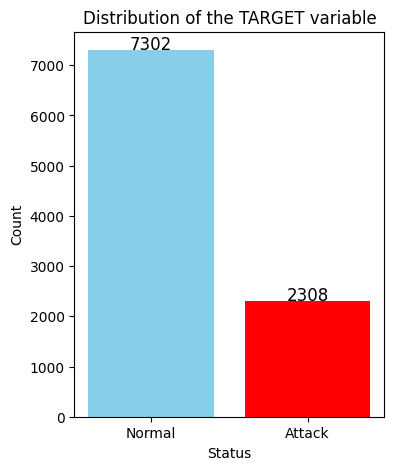

In [125]:
# Count occurrences of each category in 'Status'
status_counts = df['Status'].astype(str).value_counts()
labels = status_counts.index  # Get category names ('Normal', 'Attack')
sizes = status_counts.values  # Get counts for each category

# Define colors for better visualization
colors = ['skyblue', 'red']

# Increase figure size (width=10, height=6)
plt.figure(figsize=(8, 4))

# Create a bar graph
plt.figure(figsize=(4, 5))  # Adjust figure size
plt.bar(labels, sizes, color=colors)

# Add labels and title
plt.xlabel('Status')
plt.ylabel('Count')
plt.title('Distribution of the TARGET variable')

# Display value labels on top of bars
for i, v in enumerate(sizes):
    plt.text(i, v + 5, str(v), ha='center', fontsize=12)

# Show the bar graph
plt.show()

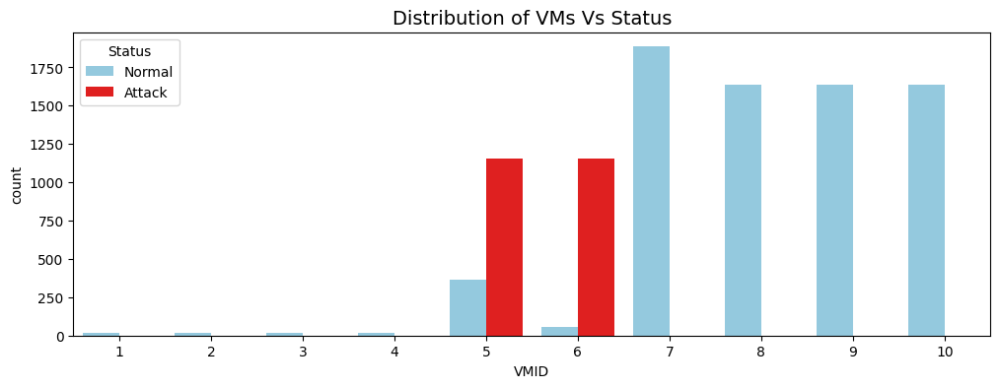

In [126]:
plt.figure(figsize=(12,4))
sns.countplot(x="VMID", hue="Status", data=df,
              hue_order=["Normal", "Attack"],  # Ensure order of categories
              palette={"Normal": "skyblue", "Attack": "red"})  # Define colors
plt.title("Distribution of VMs Vs Status", fontsize=14)  # Adjust title size
plt.show()

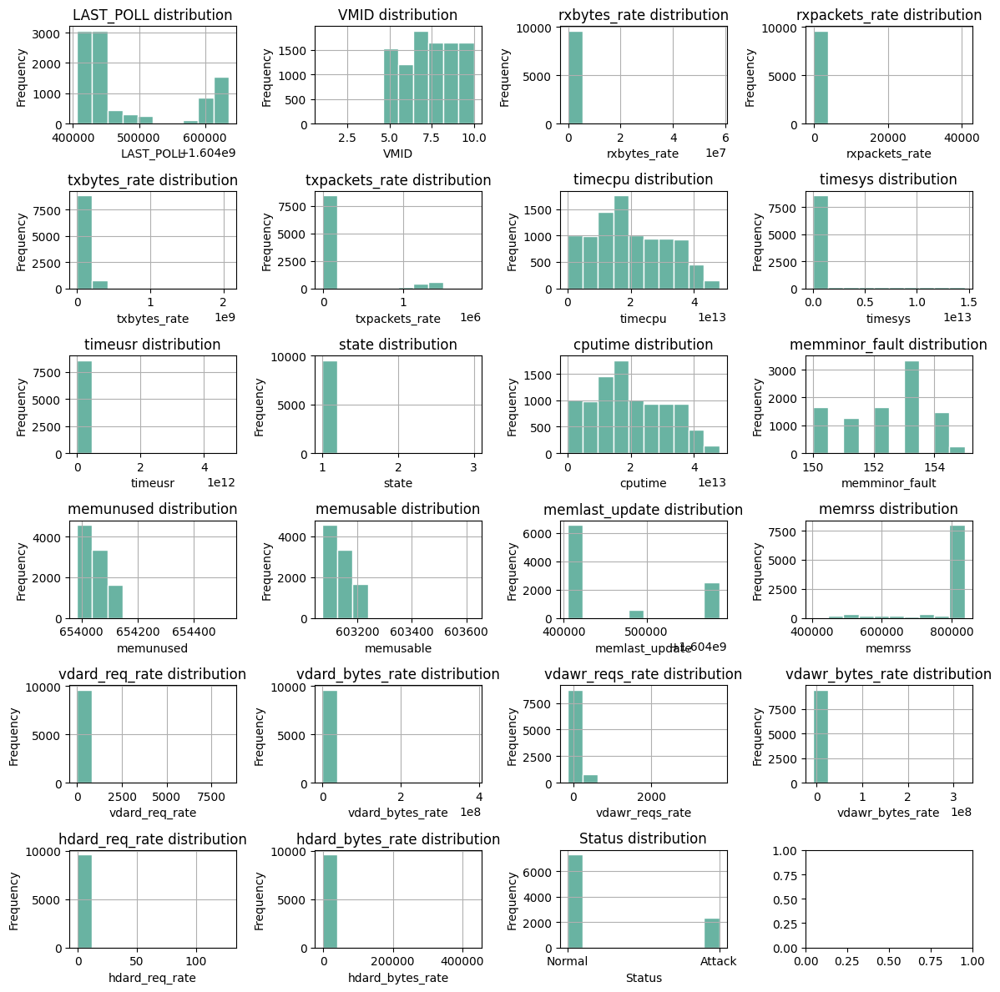

In [127]:
# Initialize a 3x3 charts
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(12, 12)) # Increase the number of rows to 6 to accommodate all 23 columns

# Flatten the axes array (makes it easier to iterate over)
axes = axes.flatten()

# Loop through each column and plot a histogram
for i, column in enumerate(df.columns):
    # Add the histogram
    df[column].hist(ax=axes[i], # Define on which ax we're working on
                    edgecolor='white', # Color of the border
                    color='#69b3a2' # Color of the bins
                   )

    # Add title and axis label
    axes[i].set_title(f'{column} distribution')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

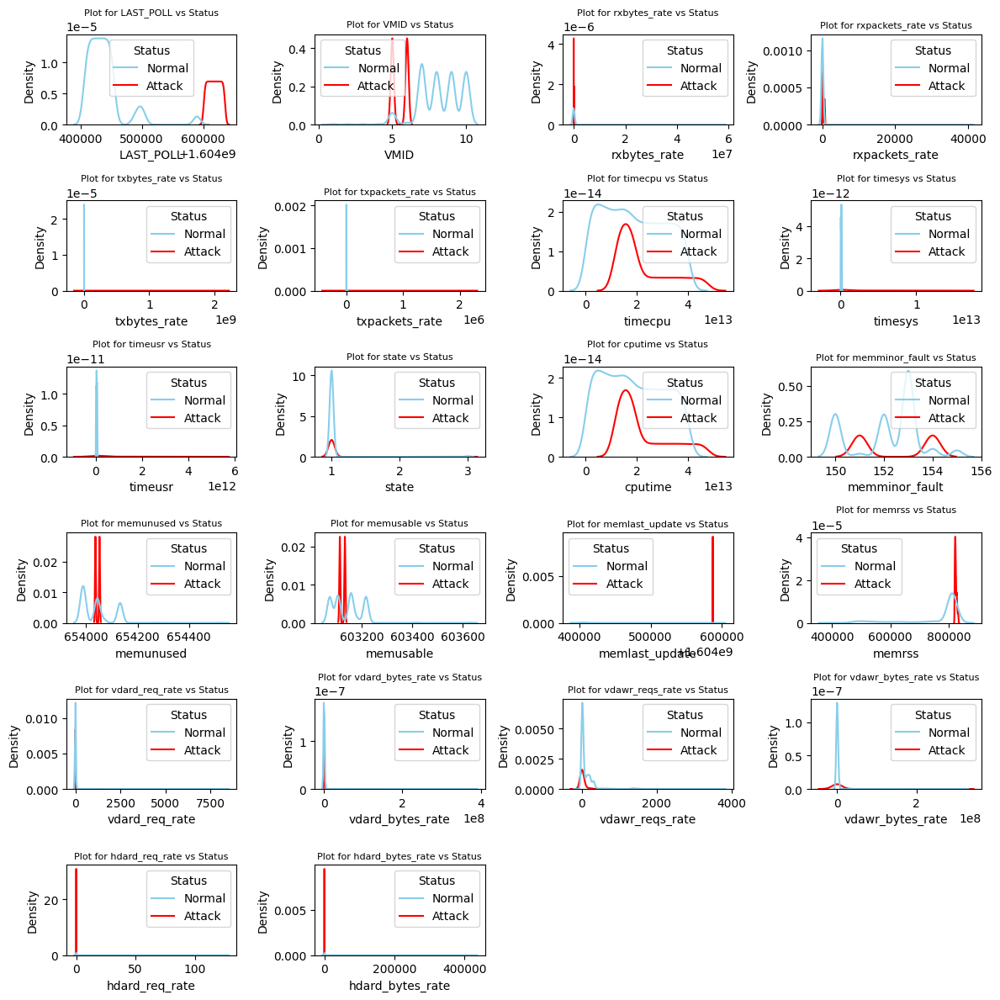

In [128]:
numerical_cols =['LAST_POLL','VMID','rxbytes_rate','rxpackets_rate','txbytes_rate','txpackets_rate','timecpu','timesys','timeusr','state','cputime','memminor_fault','memunused','memusable','memlast_update','memrss','vdard_req_rate','vdard_bytes_rate','vdawr_reqs_rate','vdawr_bytes_rate','hdard_req_rate','hdard_bytes_rate']
# Set up the matplotlib figure
plt.figure(figsize=(12, 12))

# Create count plots for each numerical feature
# Adjust the subplot grid to accommodate all 22 features (e.g., 6 rows x 4 columns)
for i, feature in enumerate(numerical_cols):
    plt.subplot(6, 4, i + 1)  # Changed to 6 rows, 4 columns to fit all features
    sns.kdeplot(data=df, x=feature, hue='Status',
                hue_order=["Normal", "Attack"],  # Ensure correct order
                palette={"Normal": "skyblue", "Attack": "red"})  # Assign colors

    plt.title(f'Plot for {feature} vs Status', fontsize=8)
    plt.xlabel(feature)
    plt.ylabel('Density')  # KDE plots use density instead of count

plt.tight_layout()
plt.show()

In [129]:
#lets fill in missing values
# List of rate columns where zeros need to be replaced
rate_columns = [
    'rxbytes_rate', 'rxpackets_rate', 'txbytes_rate', 'txpackets_rate',
    'vdard_req_rate', 'vdard_bytes_rate', 'vdawr_reqs_rate',
    'vdawr_bytes_rate', 'hdard_req_rate', 'hdard_bytes_rate'
]

# Replace zeros with a small non-zero value for each column
for column in rate_columns:
    # Calculate a small fraction of the mean of non-zero values in the column
    small_value = df[df[column] > 0][column].mean() * 0.1  # 10% of the mean
    # Replace zeros with the small value
    df[column] = df[column].replace(0, small_value)

# Display the updated DataFrame
print(df.head())


    LAST_POLL  VMID  rxbytes_rate  rxpackets_rate  txbytes_rate  \
0  1604406033     7   9688.779529       15.773351  7.068319e+06   
1  1604406062     7   1737.931034       33.103448  2.731034e+02   
2  1604406092     7   1860.000000       34.000000  2.640000e+02   
3  1604406122     7   1680.000000       32.000000  7.068319e+06   
4  1604406153     7   1509.677419       29.032258  1.354839e+02   

   txpackets_rate       timecpu       timesys       timeusr  state  ...  \
0    38291.334424  1.020000e+12  6.070000e+09  4.420000e+09      1  ...   
1        4.137931  1.040000e+12  6.120000e+09  4.450000e+09      1  ...   
2        4.000000  1.060000e+12  6.190000e+09  4.490000e+09      1  ...   
3    38291.334424  1.080000e+12  6.240000e+09  4.550000e+09      1  ...   
4        1.935484  1.100000e+12  6.320000e+09  4.620000e+09      1  ...   

   memusable  memlast_update  memrss  vdard_req_rate  vdard_bytes_rate  \
0     603072      1604405004  480732       23.778828      1.334142e+06  

In [130]:
df.head()

,LAST_POLL,VMID,rxbytes_rate,rxpackets_rate,txbytes_rate,txpackets_rate,timecpu,timesys,timeusr,state,...,memusable,memlast_update,memrss,vdard_req_rate,vdard_bytes_rate,vdawr_reqs_rate,vdawr_bytes_rate,hdard_req_rate,hdard_bytes_rate,Status
0,1604406033,7,9688.779529,15.773351,7.068319e+06,38291.334424,1.020000e+12,6.070000e+09,4.420000e+09,1,...,603072,1604405004,480732,23.778828,1.334142e+06,9.575057,5.201945e+05,3.78231,12314.610938,Normal
1,1604406062,7,1737.931034,33.103448,2.731034e+02,4.137931,1.040000e+12,6.120000e+09,4.450000e+09,1,...,603072,1604405004,480732,23.778828,1.334142e+06,95.172414,6.525352e+05,3.78231,12314.610938,Normal
2,1604406092,7,1860.000000,34.000000,2.640000e+02,4.000000,1.060000e+12,6.190000e+09,4.490000e+09,1,...,603072,1604405004,480984,23.778828,1.334142e+06,326.000000,3.334144e+06,3.78231,12314.610938,Normal
3,1604406122,7,1680.000000,32.000000,7.068319e+06,38291.334424,1.080000e+12,6.240000e+09,4.550000e+09,1,...,603072,1604405004,480984,23.778828,1.334142e+06,60.000000,4.341760e+05,3.78231,12314.610938,Normal
4,1604406153,7,1509.677419,29.032258,1.354839e+02,1.935484,1.100000e+12,6.320000e+09,4.620000e+09,1,...,603072,1604405004,480880,23.778828,1.334142e+06,226.451613,2.774710e+06,3.78231,12314.610938,Normal


In [131]:
# Lets know the columns existing in the dataframe
df.columns

Index(['LAST_POLL', 'VMID', 'rxbytes_rate', 'rxpackets_rate', 'txbytes_rate',
       'txpackets_rate', 'timecpu', 'timesys', 'timeusr', 'state', 'cputime',
       'memminor_fault', 'memunused', 'memusable', 'memlast_update', 'memrss',
       'vdard_req_rate', 'vdard_bytes_rate', 'vdawr_reqs_rate',
       'vdawr_bytes_rate', 'hdard_req_rate', 'hdard_bytes_rate', 'Status'],
      dtype='object')

In [132]:
# we have excluded the TARGET variable because we want to generte a heatmap which only takes in numerical variable
dfn=df[['VMID', 'rxbytes_rate', 'rxpackets_rate', 'txbytes_rate',
       'txpackets_rate', 'timecpu', 'timesys', 'timeusr', 'state', 'cputime',
       'memminor_fault', 'memunused', 'memusable', 'memlast_update', 'memrss',
       'vdard_req_rate', 'vdard_bytes_rate', 'vdawr_reqs_rate',
       'vdawr_bytes_rate', 'hdard_req_rate', 'hdard_bytes_rate']]

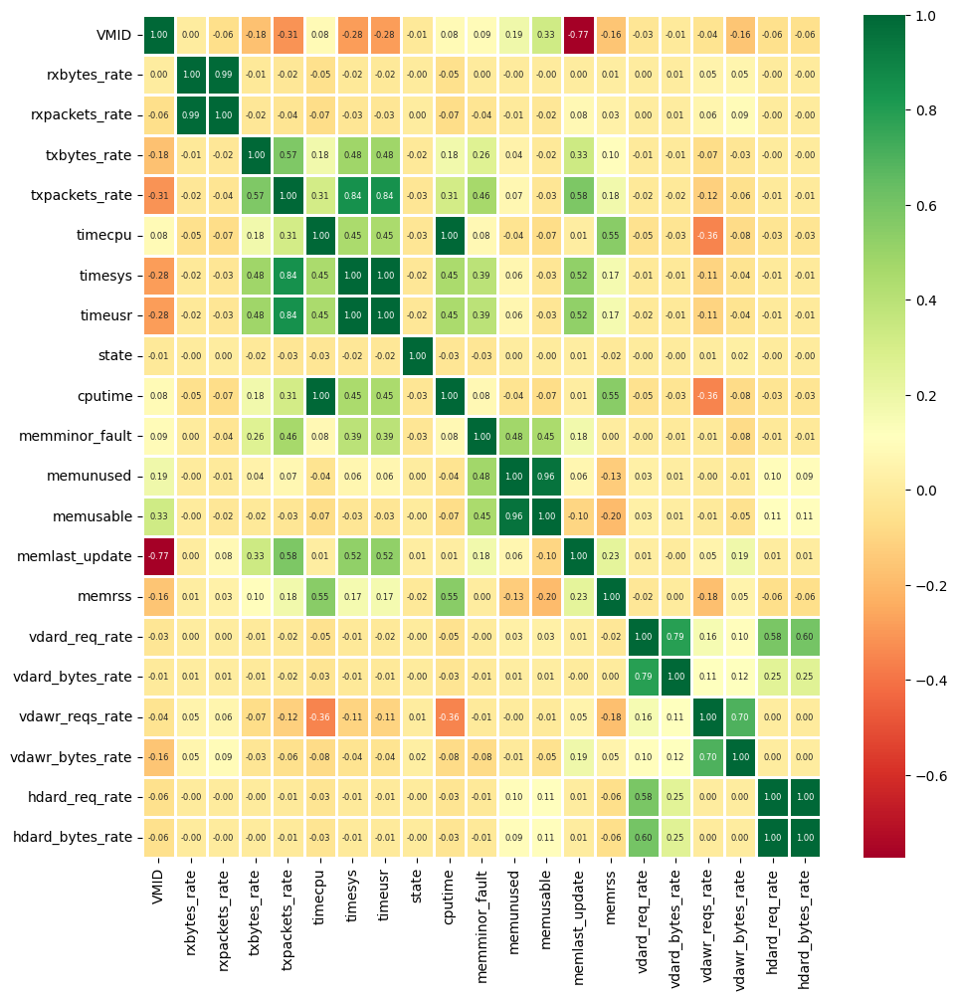

In [133]:
#Plot correlation matrix
plt.figure(figsize=(11, 11))
sns.heatmap(dfn.corr(), linewidth=1, annot=True,fmt=".2f",cmap="RdYlGn", annot_kws={"size":6})
plt.show()

In [134]:
# lets copy df to another dataframe model_df to be used for model training
model_df=df.copy()

In [135]:
model_df.columns

Index(['LAST_POLL', 'VMID', 'rxbytes_rate', 'rxpackets_rate', 'txbytes_rate',
       'txpackets_rate', 'timecpu', 'timesys', 'timeusr', 'state', 'cputime',
       'memminor_fault', 'memunused', 'memusable', 'memlast_update', 'memrss',
       'vdard_req_rate', 'vdard_bytes_rate', 'vdawr_reqs_rate',
       'vdawr_bytes_rate', 'hdard_req_rate', 'hdard_bytes_rate', 'Status'],
      dtype='object')

**SPLITTING THE DATASET**

In [136]:
#Splitting the model_df dataset into features and target
# we have also deleted columns that represent the same information because they are highly and positively correlated
X = model_df.drop(columns=['LAST_POLL','VMID','rxpackets_rate','txpackets_rate','memusable','Status',])  # Features
y = model_df['Status']  # Target

In [137]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [138]:
# Combine X_test and y_test
combined_dataset = pd.concat([pd.DataFrame(X_test), pd.Series(y_test.squeeze(), name='target')], axis=1)

# Display the combined dataset
print(combined_dataset.head())
combined_dataset =pd.DataFrame(combined_dataset)
combined_dataset

      rxbytes_rate  txbytes_rate       timecpu       timesys       timeusr  \
3051   1506.206897  7.068319e+06  3.520000e+13  1.540000e+11  5.837000e+10   
3858   1800.000000  7.068319e+06  7.410000e+12  3.525000e+10  1.802000e+10   
4222   1560.000000  7.068319e+06  1.620000e+13  8.382000e+10  3.323000e+10   
2412   1610.322581  7.068319e+06  1.960000e+13  9.265000e+10  3.594000e+10   
9090   1590.967742  2.298697e+08  3.140000e+13  8.110000e+12  2.660000e+12   

      state       cputime  memminor_fault  memunused  memlast_update  memrss  \
3051      1  3.520000e+13             150     653992      1604405111  812388   
3858      1  7.410000e+12             153     654132      1604405632  707048   
4222      1  1.620000e+13             153     654132      1604405632  810892   
2412      1  1.960000e+13             150     653992      1604405111  813360   
9090      1  3.140000e+13             154     654052      1604587567  824800   

      vdard_req_rate  vdard_bytes_rate  vdawr_reqs

,rxbytes_rate,txbytes_rate,timecpu,timesys,timeusr,state,cputime,memminor_fault,memunused,memlast_update,memrss,vdard_req_rate,vdard_bytes_rate,vdawr_reqs_rate,vdawr_bytes_rate,hdard_req_rate,hdard_bytes_rate,target
3051,1506.206897,7.068319e+06,3.520000e+13,1.540000e+11,5.837000e+10,1,3.520000e+13,150,653992,1604405111,812388,23.778828,1.334142e+06,12.413793,59321.379310,3.78231,12314.610938,Normal
3858,1800.000000,7.068319e+06,7.410000e+12,3.525000e+10,1.802000e+10,1,7.410000e+12,153,654132,1604405632,707048,23.778828,1.334142e+06,164.000000,999424.000000,3.78231,12314.610938,Normal
4222,1560.000000,7.068319e+06,1.620000e+13,8.382000e+10,3.323000e+10,1,1.620000e+13,153,654132,1604405632,810892,23.778828,1.334142e+06,38.181818,268101.818182,3.78231,12314.610938,Normal
2412,1610.322581,7.068319e+06,1.960000e+13,9.265000e+10,3.594000e+10,1,1.960000e+13,150,653992,1604405111,813360,23.778828,1.334142e+06,21.290323,253687.741935,3.78231,12314.610938,Normal
9090,1590.967742,2.298697e+08,3.140000e+13,8.110000e+12,2.660000e+12,1,3.140000e+13,154,654052,1604587567,824800,23.778828,1.334142e+06,9.575057,520194.453471,3.78231,12314.610938,Attack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2667,1560.000000,7.068319e+06,2.570000e+13,1.150000e+11,4.466000e+10,1,2.570000e+13,150,653992,1604405111,812028,23.778828,1.334142e+06,20.000000,98304.000000,3.78231,12314.610938,Normal
9321,1764.000000,2.318210e+08,3.880000e+13,1.100000e+13,3.600000e+12,1,3.880000e+13,154,654052,1604587567,823632,23.778828,1.334142e+06,9.575057,520194.453471,3.78231,12314.610938,Attack
2943,1506.206897,7.068319e+06,3.250000e+13,1.430000e+11,5.434000e+10,1,3.250000e+13,150,653992,1604405111,812492,23.778828,1.334142e+06,14.482759,84744.827586,3.78231,12314.610938,Normal
3169,1688.571429,7.068319e+06,3.820000e+13,1.660000e+11,6.247000e+10,1,3.820000e+13,150,653992,1604405111,812520,23.778828,1.334142e+06,9.575057,520194.453471,3.78231,12314.610938,Normal


**BALANCING THE DATASET**

In [139]:
#smottomek
# This will balance the training set including the Target variable which is the y-train
smotetomek = SMOTETomek(random_state=0)
X_resampled, y_resampled = smotetomek.fit_resample(X_train, y_train)

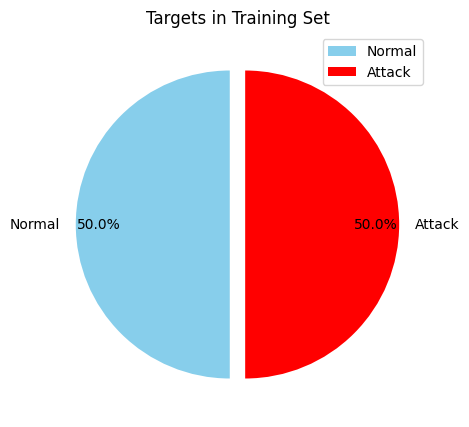

In [140]:
colors = ['skyblue', 'red']
explode = (0.05,0.05)
plt.figure(figsize=(5, 5))
plt.pie(pd.Series(y_resampled).value_counts(), colors = colors, labels=['Normal', 'Attack'],
        autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
plt.legend()
plt.title("Targets in Training Set")
plt.show()


**HEATMAP AFTER BALANCING THE DATASET**

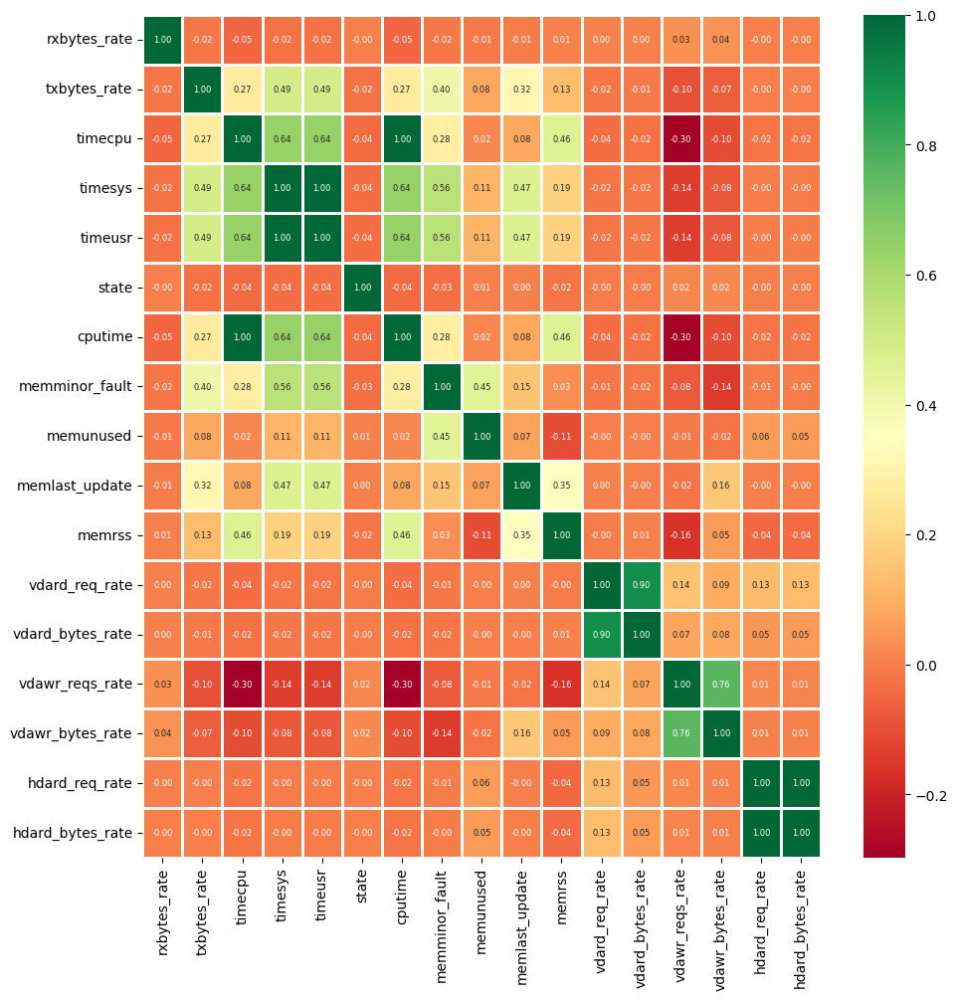

In [141]:
#Plot correlation matrix
plt.figure(figsize=(11, 11))
sns.heatmap(X_resampled.corr(), linewidth=1, annot=True,fmt=".2f",cmap="RdYlGn", annot_kws={"size":6})
plt.show()

In [142]:
# Convert the target variable to numeric before fitting the model
y_resampled = y_resampled.map({'Normal': 0, 'Attack': 1}).astype(int)
y_test = y_test.map({'Normal': 0, 'Attack': 1}).astype(int)

**FEATURE SCALING**

In [143]:
scaler= MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_resampled)
X_test_scaled = scaler.transform(X_test)

In [144]:
# After scaling the feature names (column titles) will disapper,we need to restore them
feature_names = X.columns
X_train_scaled = pd.DataFrame(X_train_scaled, columns=feature_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=feature_names)

**TRAINING A K-NEAREST NEIGHBOUR CLASSIFIER**

In [145]:
# TRAINING THE K-NEAREST NEIGHBOURS ALGORITHM
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
# Create the K-nearest Neighbours Classifier and use the train dataset to train the model
classifier_knn1 = KNeighborsClassifier(n_neighbors=1)
classifier_knn1.fit(X_train_scaled, y_resampled)

KNeighborsClassifier(n_neighbors=1)

In [146]:
# predict the results of the KNN-model
y_predknn=classifier_knn1.predict(X_test_scaled)
accuracy_score(y_test, y_predknn)

1.0

**1 ARTIFITIAL NEURAL NETWOTK (ANN) IMPLEMENTATION**

In [147]:
# Define the ANN model
ann_model = Sequential()
ann_model.add(Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],)))  # Input layer with 128 neurons
ann_model.add(Dropout(0.2))  # Dropout for regularization
ann_model.add(Dense(64, activation='relu'))  # Hidden layer with 64 neurons
ann_model.add(Dropout(0.2))
ann_model.add(Dense(1, activation='sigmoid'))  # Output layer with sigmoid activation for binary classification

# Compile the model
ann_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
ann_model.fit(X_train_scaled, y_resampled, epochs=2, batch_size=32, validation_split=0.2)

print("ANN model training completed.")

Epoch 1/2
293/293 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9533 - loss: 0.2451 - val_accuracy: 1.0000 - val_loss: 0.0064
Epoch 2/2
293/293 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9958 - loss: 0.0117 - val_accuracy: 1.0000 - val_loss: 0.0019
ANN model training completed.


In [148]:
# Evaluate the model
loss, ann_accuracy = ann_model.evaluate(X_test_scaled, y_test, verbose=0)
print(f"ANN Model - Loss: {loss:.4f}, Accuracy: {ann_accuracy:.4f}")

ANN Model - Loss: 0.0027, Accuracy: 1.0000


In [149]:
# Make predictions
y_pred_probs = ann_model.predict(X_test_scaled)
y_pred = (y_pred_probs > 0.5).astype(int)  # Convert probabilities to class labels (0 or 1)

# Generate classification report
from sklearn.metrics import classification_report, confusion_matrix
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_ann = confusion_matrix(y_test, y_pred)
print(cm_ann)


61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1444
           1       1.00      1.00      1.00       478

    accuracy                           1.00      1922
   macro avg       1.00      1.00      1.00      1922
weighted avg       1.00      1.00      1.00      1922


Confusion Matrix:
[[1444    0]
 [   0  478]]


**2 TIME SERIES TRANSFORMER IMPLEMENTATION OF (TST)**

In [150]:
# Define Time Series Transformer (TST) Model
def build_tst(input_shape, num_heads=4, d_model=64, dropout_rate=0.2):
    inputs = Input(shape=input_shape)

    # Linear Transformation (instead of LSTM)
    x = Dense(d_model, activation="relu")(inputs)
    x = Dropout(dropout_rate)(x)

    # Stack multiple Multi-Head Attention blocks (Temporal Fusion)
    for _ in range(2):  # You can adjust the number of blocks
        attention_output = MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
        attention_output = Dropout(dropout_rate)(attention_output)
        attention_output = LayerNormalization(epsilon=1e-6)(attention_output)

        # Add & Normalize (residual connection)
        x = tf.keras.layers.Add()([x, attention_output])

    # Global Average Pooling to get a single vector representation
    x = GlobalAveragePooling1D()(x)

    # Fully Connected Layers
    x = Dense(100, activation="relu")(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(1, activation="sigmoid")(x)  # Binary classification

    model = Model(inputs, x)
    return model

# Reshape input to fit TST (expecting 3D: [batch, time_steps, features])
X_train_reshaped = X_train_scaled.values.reshape(X_train_scaled.shape[0], X_train_scaled.shape[1], 1)

# Initialize and compile the TST model
tst_model = build_tst(input_shape=(X_train_scaled.shape[1], 1))
tst_model.compile(optimizer=Adam(learning_rate=0.001), loss="binary_crossentropy", metrics=["accuracy"])

# Train the TST model
tst_model.fit(X_train_reshaped, y_resampled, batch_size=32, epochs=5, validation_split=0.2)


Epoch 1/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7815 - loss: 0.4125 - val_accuracy: 0.5638 - val_loss: 0.4269
Epoch 2/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.8102 - loss: 0.3332 - val_accuracy: 0.5497 - val_loss: 0.4302
Epoch 3/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 15s 51ms/step - accuracy: 0.8065 - loss: 0.3301 - val_accuracy: 0.5254 - val_loss: 0.4994
Epoch 4/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 22s 58ms/step - accuracy: 0.8018 - loss: 0.3306 - val_accuracy: 0.5472 - val_loss: 0.3454
Epoch 5/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.8092 - loss: 0.3265 - val_accuracy: 0.5147 - val_loss: 0.4630


In [151]:
# Evaluate the model
# Reshape X_test_scaled to match the input shape of the TFT model
X_test_reshaped = X_test_scaled.values.reshape(X_test_scaled.shape[0], X_test_scaled.shape[1], 1)  # Use .values to get the NumPy array before reshaping

tst_loss, tst_accuracy = tst_model.evaluate(X_test_reshaped, y_test, verbose=0)
print(f"TST Model - Loss: {tst_loss:.4f}, Accuracy: {tst_accuracy:.4f}")

TST Model - Loss: 0.2613, Accuracy: 0.8814


In [152]:
y_pred_probs_tst = tst_model.predict(X_test_reshaped)
y_pred_tst = (y_pred_probs_tst > 0.5).astype(int)

61/61 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step


In [153]:
print(classification_report(y_test, y_pred_tst))

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_tst = confusion_matrix(y_test, y_pred_tst)
print(cm_tst)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      1444
           1       0.95      0.55      0.70       478

    accuracy                           0.88      1922
   macro avg       0.91      0.77      0.81      1922
weighted avg       0.89      0.88      0.87      1922


Confusion Matrix:
[[1431   13]
 [ 215  263]]


**LIME EXPLAINBILITY WITH TIME SERIES TRANSFORMER (TST)**

In [154]:
# Step 4: Apply LIME for Explainability
# Reshape data for LIME compatibility
X_flat = X_train_scaled.values

# Get the actual feature names from your DataFrame
feature_names = list(X_train_scaled.columns)  # Assuming X_train_scaled is a DataFrame

# Initialize LIME Tabular Explainer with actual feature names
explainer = lime_tabular.LimeTabularExplainer(
    X_flat,
    mode='classification',
    feature_names=feature_names,  # Use actual feature names here
    class_names=["Normal", "Attack"],
    discretize_continuous=True
)

# Instances to explain
instance_indices = [1, 2, 10]

# Generate explanations for each instance
for instance_index in instance_indices:
    # Get the instance to explain
    sample = X_flat[instance_index]  # No need for reshaping here

    # Reshape the sample for the TST model:
    sample_reshaped = sample.reshape(1, X_train_scaled.shape[1], 1)

    # Define a prediction function for LIME that handles reshaping:
    def predict_fn_lime(x):
        x_reshaped = x.reshape(x.shape[0], X_train_scaled.shape[1], 1)  # Reshape to 3D
        predictions = tst_model.predict(x_reshaped)
        # For binary classification, return probabilities for both classes
        probabilities = np.column_stack((1 - predictions, predictions))  # Changed line
        return probabilities

    # Explain the prediction using the custom prediction function:
    explanation = explainer.explain_instance(sample, predict_fn_lime, num_features=8) # changed here

    # Visualize the explanation
    explanation.show_in_notebook()

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step


### **SHAP EXPLAINABILITY WITH TIME SERIES TRANSFORMER**\

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
6507/6507 ━━━━━━━━━━━━━━━━━━━━ 88s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
6507/6507 ━━━━━━━━━━━━━━━━━━━━ 88s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
6507/6507 ━━━━━━━━━━━━━━━━━━━━ 93s 14ms/step


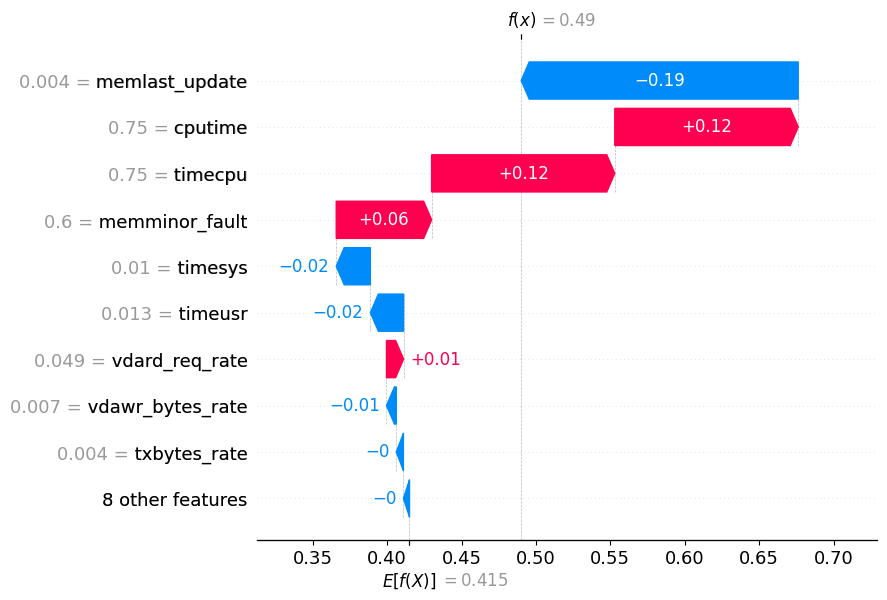

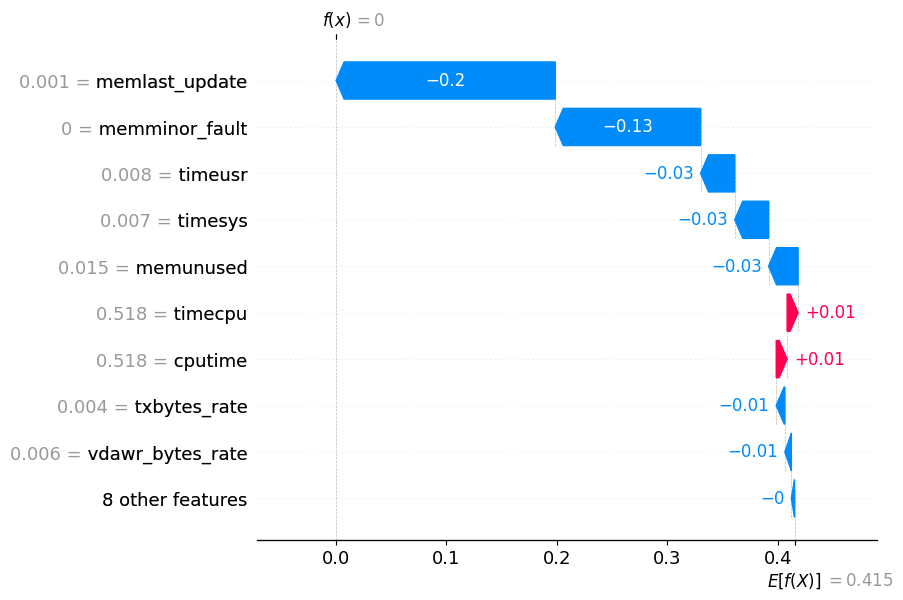

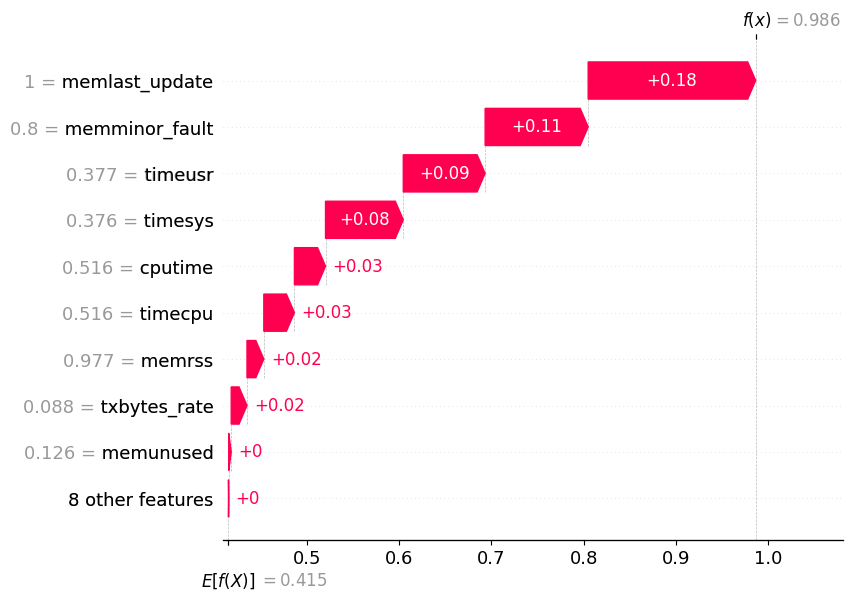

In [155]:
# 1. Summarize background data for SHAP:
# Use a subset of the training data (e.g., 100 samples) or k-means clustering
# to create a representative background dataset. This helps SHAP understand
# the typical data distribution.
background_data = shap.kmeans(X_train_scaled, 100)  # Using k-means for background

# 2. Initialize SHAP KernelExplainer:
# The KernelExplainer works with any model and is model-agnostic.
# Provide your TST model's prediction function (`predict_fn_lime` from your code)
# and the background data.
explainer_shap = shap.KernelExplainer(predict_fn_lime, background_data)

# 3. Generate SHAP values:
# Calculate SHAP values for the instances you want to explain.
# Use the same `instance_indices` from your LIME code.
instance_indices = [1, 2, 10]
shap_values = [explainer_shap.shap_values(X_flat[i]) for i in instance_indices]

# 4. Create SHAP waterfall plots:
for i, instance_index in enumerate(instance_indices):
    # Get SHAP values for the instance, selecting for a single class (e.g., class 1 - Attack)
    instance_shap_values = shap_values[i][:, 1]  # Select SHAP values for class 1 (Attack)

    # Generate and display the waterfall plot
    shap.waterfall_plot(shap.Explanation(
        values=instance_shap_values,
        base_values=explainer_shap.expected_value[1],  # Assuming expected_value has shape (n_classes,)
        data=X_flat[instance_index],
        feature_names=feature_names
    ))

### **PERMUTATION IMPORTANCE EXPLAINABILITY WITH TIME SERIES TRANSFORMER**\

367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 6s 16

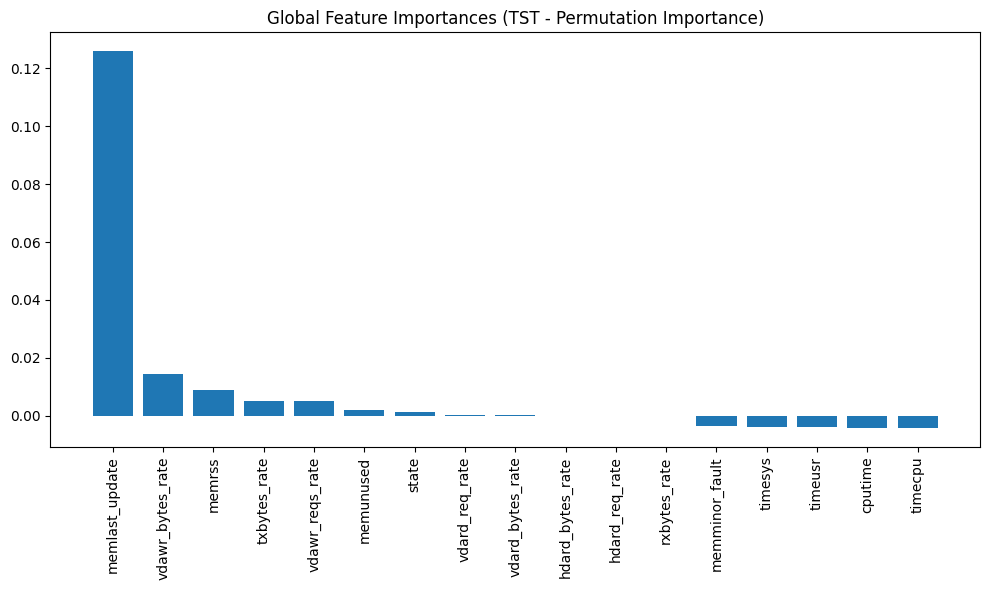

In [156]:
from sklearn.inspection import permutation_importance # Import permutation_importance
# 1. Define a custom scoring function:
# Since permutation_importance expects a scorer that takes (estimator, X, y) as input,
# we need to define a custom function that uses your model's predict_proba method
# and then calculates accuracy based on the predicted probabilities.

def custom_scoring_function(estimator, X, y):
    # Reshape X to 3D for the TST model:
    X_reshaped = X.reshape(X.shape[0], X_train_scaled.shape[1], 1)

    # Get predictions:
    y_pred_proba = estimator.predict(X_reshaped)

    # Convert probabilities to class labels:
    y_pred = (y_pred_proba > 0.5).astype(int)

    # Calculate and return accuracy:
    return accuracy_score(y, y_pred)

# 2. Calculate permutation importance:
# Apply permutation_importance using your custom scoring function:
# Reshape X_train_scaled to 2D before passing to permutation_importance
X_train_scaled_2d = X_train_scaled.values.reshape(X_train_scaled.shape[0], -1)  # Reshape to 2D

result = permutation_importance(
    tst_model,  # Your trained TST model
    X_train_scaled_2d,  # Pass the 2D reshaped data
    y_resampled,  # Your training target variable
    n_repeats=10,  # Number of times to permute each feature
    random_state=42,  # For reproducibility
    scoring=custom_scoring_function  # Your custom scoring function
)

# 3. Get feature importances:
importances = result.importances_mean

# 4. Sort feature importances:
indices = np.argsort(importances)[::-1]

# 5. Visualize feature importances:
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.title("Global Feature Importances (TST - Permutation Importance)")
plt.bar(range(X_train_scaled.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train_scaled.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

**3 TEMPORAL FUSION TRANSFORMER IMPLEMENTATION (TFT)**

In [158]:
# Define TFT Model
def build_tft(input_shape, num_heads=4, d_model=64, dropout_rate=0.2):
    inputs = Input(shape=input_shape)

    # LSTM Encoder
    x = LSTM(units=d_model, return_sequences=True)(inputs)
    x = Dropout(dropout_rate)(x)

    # Multi-Head Attention (Temporal Fusion)
    attention_output = MultiHeadAttention(num_heads=num_heads, key_dim=d_model)(x, x)
    attention_output = Dropout(dropout_rate)(attention_output)
    attention_output = LayerNormalization(epsilon=1e-6)(attention_output)

    # Add & Normalize
    x = tf.keras.layers.Add()([x, attention_output])

    # Global Average Pooling to get a single vector representation
    x = tf.keras.layers.GlobalAveragePooling1D()(x)  # Added GlobalAveragePooling1D

    # Fully Connected Layers
    x = Dense(100, activation="relu")(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(1, activation="sigmoid")(x)  # Binary classification

    model = Model(inputs, x)
    return model

# Reshape input to fit TFT (expecting 3D: [batch, time_steps, features])
X_train_reshaped = X_train_scaled.values.reshape(X_train_scaled.shape[0], X_train_scaled.shape[1], 1) # Use .values to get the NumPy array before reshaping

# Initialize and compile model
tft_model = build_tft(input_shape=(X_train_scaled.shape[1], 1))
tft_model.compile(optimizer=Adam(learning_rate=0.001), loss="binary_crossentropy", metrics=["accuracy"])

# Train the model
tft_model.fit(X_train_reshaped, y_resampled, batch_size=32, epochs=5, validation_split=0.2)


Epoch 1/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - accuracy: 0.7917 - loss: 0.4187 - val_accuracy: 1.0000 - val_loss: 0.0264
Epoch 2/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - accuracy: 0.9564 - loss: 0.1216 - val_accuracy: 1.0000 - val_loss: 0.0143
Epoch 3/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - accuracy: 0.9711 - loss: 0.0749 - val_accuracy: 1.0000 - val_loss: 0.0119
Epoch 4/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - accuracy: 0.9896 - loss: 0.0393 - val_accuracy: 1.0000 - val_loss: 0.0066
Epoch 5/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - accuracy: 0.9899 - loss: 0.0279 - val_accuracy: 1.0000 - val_loss: 0.0021


In [161]:
# Evaluate the model
# Reshape X_test_scaled to match the input shape of the TFT model
X_test_reshaped = X_test_scaled.values.reshape(X_test_scaled.shape[0], X_test_scaled.shape[1], 1)
tft_loss, tft_accuracy = tft_model.evaluate(X_test_reshaped, y_test, verbose=0)
print(f"TFT Model - Loss: {tft_loss:.4f}, Accuracy: {tft_accuracy:.4f}")

TFT Model - Loss: 0.0268, Accuracy: 0.9922


In [162]:
y_pred_probs_tft = tft_model.predict(X_test_scaled)
y_pred_tft = (y_pred_probs_tft > 0.5).astype(int)

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


In [163]:
print(classification_report(y_test, y_pred_tft))

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_tft = confusion_matrix(y_test, y_pred_tft)
print(cm_tft)

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1444
           1       0.98      0.99      0.98       478

    accuracy                           0.99      1922
   macro avg       0.99      0.99      0.99      1922
weighted avg       0.99      0.99      0.99      1922


Confusion Matrix:
[[1432   12]
 [   3  475]]


**4 TEMPORAL CONVOLUTIONAL NETWORK IMPLEMENTATION (TCN)**

In [164]:
# Define TCN Block
def tcn_block(inputs, filters, kernel_size, dilation_rate, dropout_rate):
    x = Conv1D(filters, kernel_size, padding="causal", dilation_rate=dilation_rate, activation=None)(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Dropout(dropout_rate)(x)

    # Residual Connection
    res = Conv1D(filters, 1, padding="same")(inputs)  # 1x1 Convolution for matching dimensions
    x = Add()([x, res])
    x = ReLU()(x)

    return x

# Build TCN Model
def build_tcn(input_shape, num_filters=64, kernel_size=3, num_blocks=4, dropout_rate=0.2):
    inputs = Input(shape=input_shape)
    x = inputs

    # Stack multiple TCN blocks
    for i in range(num_blocks):
        x = tcn_block(x, filters=num_filters, kernel_size=kernel_size, dilation_rate=2**i, dropout_rate=dropout_rate)

    x = Flatten()(x)
    x = Dense(100, activation="relu")(x)
    x = Dense(1, activation="sigmoid")(x)  # Binary classification output

    model = Model(inputs, x)
    return model

# Reshape input for Conv1D (expecting 3D: [batch, time_steps, features])
X_train_reshaped = X_train_scaled.values.reshape(X_train_scaled.shape[0], X_train_scaled.shape[1], 1)

# Initialize and compile model
tcn_model = build_tcn(input_shape=(X_train_scaled.shape[1], 1))
tcn_model.compile(optimizer=Adam(learning_rate=0.001), loss="binary_crossentropy", metrics=["accuracy"])

# Train the model
tcn_model.fit(X_train_reshaped, y_resampled, batch_size=32, epochs=5, validation_split=0.2)

Epoch 1/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.9535 - loss: 0.1016 - val_accuracy: 1.0000 - val_loss: 0.1376
Epoch 2/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.9983 - loss: 0.0059 - val_accuracy: 1.0000 - val_loss: 5.9923e-05
Epoch 3/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 1.0000 - loss: 2.5360e-04 - val_accuracy: 1.0000 - val_loss: 3.4368e-06
Epoch 4/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.9999 - loss: 5.5319e-04 - val_accuracy: 1.0000 - val_loss: 2.0683e-07
Epoch 5/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 1.0000 - val_loss: 7.1213e-07


In [165]:
# Evaluate the model with the reshaped input
# Reshape X_test_scaled to match the input shape expected by the TCN model
X_test_reshaped = X_test_scaled.values.reshape(X_test_scaled.shape[0], X_test_scaled.shape[1], 1)
tcn_loss, tcn_accuracy = tcn_model.evaluate(X_test_reshaped, y_test, verbose=0) # Use the reshaped X_test_reshaped
print(f"TCN Model - Loss: {tcn_loss:.4f}, Accuracy: {tcn_accuracy:.4f}")

TCN Model - Loss: 0.0000, Accuracy: 1.0000


In [166]:
y_pred_probs_tcn = tcn_model.predict(X_test_scaled)
y_pred_tcn = (y_pred_probs_tcn > 0.5).astype(int)

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


In [167]:
print(classification_report(y_test, y_pred_tcn))

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_tcn = confusion_matrix(y_test, y_pred_tcn)
print(cm_tcn)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1444
           1       1.00      1.00      1.00       478

    accuracy                           1.00      1922
   macro avg       1.00      1.00      1.00      1922
weighted avg       1.00      1.00      1.00      1922


Confusion Matrix:
[[1444    0]
 [   0  478]]


**5 GATED RECURRENT UNIT IMPLEMENTATION (GRU)**

In [168]:
# Define the GRU model
gru_model = Sequential([
    GRU(64, activation='tanh', return_sequences=True, input_shape=(X_train_scaled.shape[1], 1)),
    Dropout(0.2),  # Dropout to prevent overfitting
    GRU(32, activation='tanh'),  # Second GRU layer
    Dropout(0.2),
    Dense(16, activation='relu'),  # Fully connected layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
gru_model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

# Train the model
gru_history = gru_model.fit(X_train_scaled, y_resampled,
                            epochs=5,
                            batch_size=32,
                            validation_split=0.2,
                            verbose=1)

Epoch 1/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - accuracy: 0.8296 - loss: 0.3380 - val_accuracy: 1.0000 - val_loss: 0.1033
Epoch 2/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - accuracy: 0.9878 - loss: 0.0499 - val_accuracy: 1.0000 - val_loss: 0.0107
Epoch 3/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - accuracy: 0.9913 - loss: 0.0395 - val_accuracy: 1.0000 - val_loss: 0.0064
Epoch 4/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9953 - loss: 0.0223 - val_accuracy: 1.0000 - val_loss: 0.0029
Epoch 5/5
293/293 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - accuracy: 0.9957 - loss: 0.0203 - val_accuracy: 1.0000 - val_loss: 0.0081


In [169]:
# Evaluate the model
gru_loss, gru_accuracy = gru_model.evaluate(X_test_scaled, y_test, verbose=0)
print(f"GRU Model - Loss: {gru_loss:.4f}, Accuracy: {gru_accuracy:.4f}")

GRU Model - Loss: 0.0167, Accuracy: 0.9958


In [170]:
y_pred_probs_gru = gru_model.predict(X_test_scaled)
y_pred_gru = (y_pred_probs_gru > 0.5).astype(int)

61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step


In [171]:
print(classification_report(y_test, y_pred_gru))

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_gru= confusion_matrix(y_test, y_pred_gru)
print(cm_gru)

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1444
           1       0.98      1.00      0.99       478

    accuracy                           1.00      1922
   macro avg       0.99      1.00      0.99      1922
weighted avg       1.00      1.00      1.00      1922


Confusion Matrix:
[[1436    8]
 [   0  478]]


**6 FEED FORWARD NEURAL NETWORK IMPLEMENTATION (FFNN)**

In [172]:
X_test_ffnn = X_test_scaled.copy()

In [173]:
ffnn_model= tf.keras.models.Sequential()
ffnn_model.add(tf.keras.layers.Dense(units=50, activation='relu'))
ffnn_model.add(tf.keras.layers.Dense(units=100, activation='relu'))
ffnn_model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))
ffnn_model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
ffnn_history = ffnn_model.fit(X_train_scaled, y_resampled, batch_size = 32, epochs = 5)

Epoch 1/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9248 - loss: 0.2686
Epoch 2/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9987 - loss: 0.0078
Epoch 3/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 1.0000 - loss: 0.0014
Epoch 4/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 1.0000 - loss: 4.4400e-04
Epoch 5/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 1.0000 - loss: 2.8037e-04


**MODEL EVALUATION**

In [67]:
# model evaluation for using the test dataset for the feedfoward neural network
ffnn_loss, ffnn_accuracy = ffnn_model.evaluate(X_test_scaled, y_test, verbose=0)
print ("Loss=%.4f" %ffnn_loss)
print ("Accuracy=%.4f" %ffnn_accuracy)

Loss=0.0002
Accuracy=1.0000


In [68]:
ffnn_predictions_val = ffnn_model.predict(X_test_scaled)

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [69]:
y_predffnn = (ffnn_predictions_val > 0.5).astype(int)
report = classification_report(y_test, y_predffnn)
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1444
           1       1.00      1.00      1.00       478

    accuracy                           1.00      1922
   macro avg       1.00      1.00      1.00      1922
weighted avg       1.00      1.00      1.00      1922



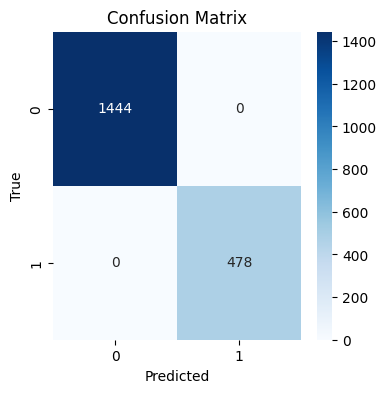

In [174]:
# Calculate confusion matrix
cnn_cm = confusion_matrix(y_test, y_predffnn)
# Plot confusion matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cnn_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

**1 LIME EXPLAINABILITY WITH FEED FORWARD EXPLAINABILITY (FFNN)**

In [175]:
# Reshape X_train_scaled back to 2D for MLPClassifier
# Use .values to get the underlying NumPy array before reshaping
X_train_scaled_2d = X_train_scaled.values.reshape(X_train_scaled.shape[0], -1)

# train the blackbox (feed Foward Neural Network)
fnn_model = MLPClassifier(hidden_layer_sizes=(23,), max_iter=10, random_state=42)
fnn_model.fit(X_train_scaled_2d, y_resampled)  # Use the reshaped data

MLPClassifier(hidden_layer_sizes=(23,), max_iter=10, random_state=42)

In [176]:
# Reshape the data back to its original dimensions before attempting to set columns
# Get the underlying NumPy array before reshaping
X_train_scaled_np = X_train_scaled.values.reshape(X_train_scaled.shape[0], X_train_scaled.shape[1])

# Convert the NumPy array to a Pandas DataFrame
X_train_scaled = pd.DataFrame(X_train_scaled_np, columns=feature_names)

# Set the columns (this will work now that it's a DataFrame)
X_train_scaled.columns = pd.Index(X_train_scaled.columns)
feature_names = list(X_train_scaled.columns)

In [177]:
#lets convert the training set to  2D-array
X_train_scaled_np = X_train_scaled.to_numpy() # X-train
y_resampled_np = y_resampled.to_numpy()


In [178]:
#lets convert the testing set to  2D-array
# X_test_scaled_np = X_test_scaled.to_numpy()  # X-test  <- This line is causing the error
X_test_scaled_np = X_test_scaled.values.reshape(X_test_scaled.shape[0], -1) # Reshape to 2D if needed
y_test_np = y_test.to_numpy()

In [179]:
# instantiating the expaliner for feedforward neural network using the LIME XAI technique
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled_np, feature_names=feature_names,class_names = ['Normal','Attack'],verbose=True, mode='classification')
explainer

In [180]:
# Generate explanationsfor feedforward neural network
explanation = explainer.explain_instance(X_test_scaled_np[1],fnn_model.predict_proba,num_features=12)
explanation.show_in_notebook()

explanation = explainer.explain_instance(X_test_scaled_np[2],fnn_model.predict_proba,num_features=12)

explanation.show_in_notebook()
explanation = explainer.explain_instance(X_test_scaled_np[1345],fnn_model.predict_proba,num_features=12)

explanation.show_in_notebook()

Intercept 0.6973283548630806
Prediction_local [-0.01323916]
Right: 0.009817232470399766


Intercept 0.4497215446250403
Prediction_local [-0.01127058]
Right: 0.011149150775048803


Intercept 0.2519830208397358
Prediction_local [1.19279024]
Right: 0.9883442525231516


**FFNN EXPLAINABILITY WITH SHAP WATER FALL PLOTS**

  0%|          | 0/1922 [00:00<?, ?it/s]

Generating waterfall plot for instance 1


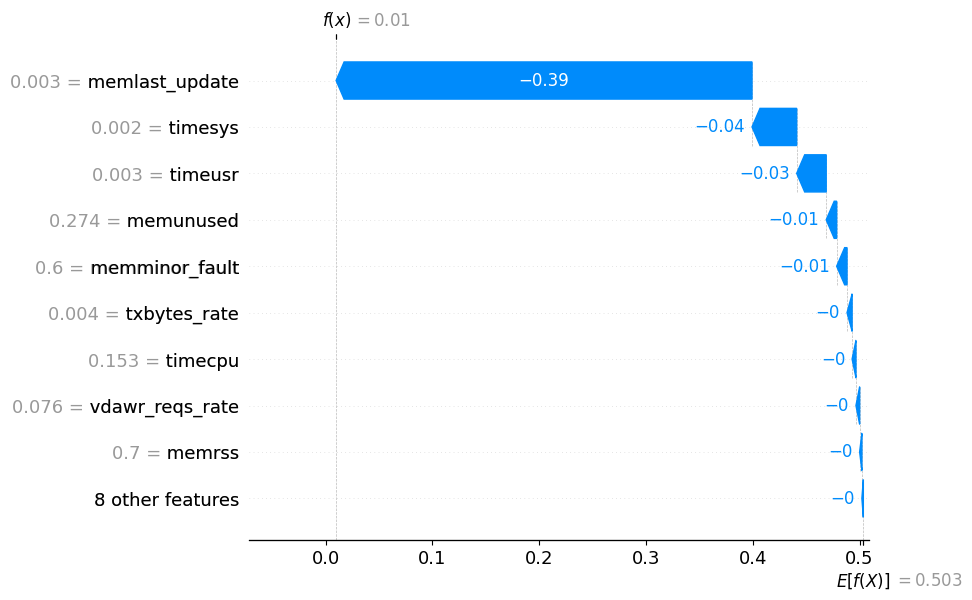

Generating waterfall plot for instance 2


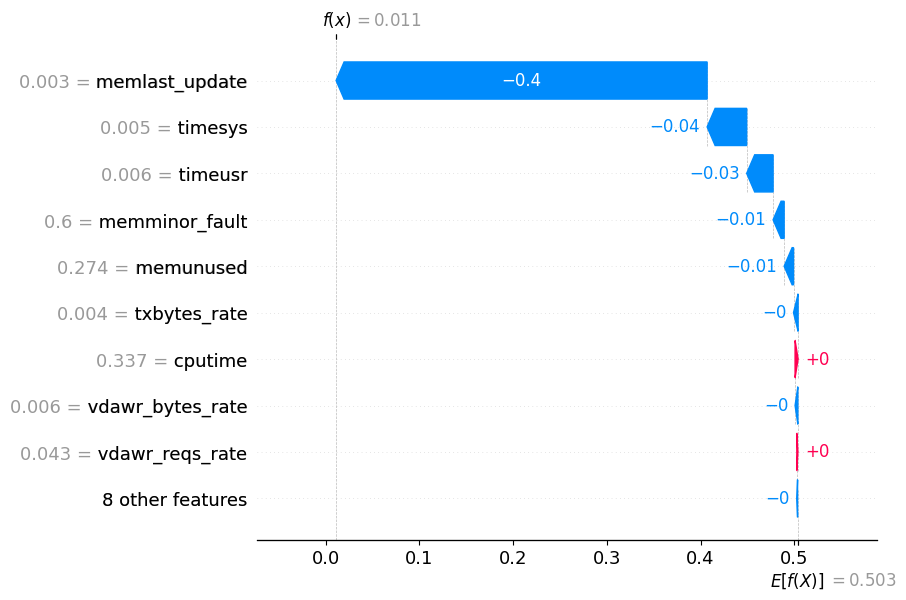

Generating waterfall plot for instance 1345


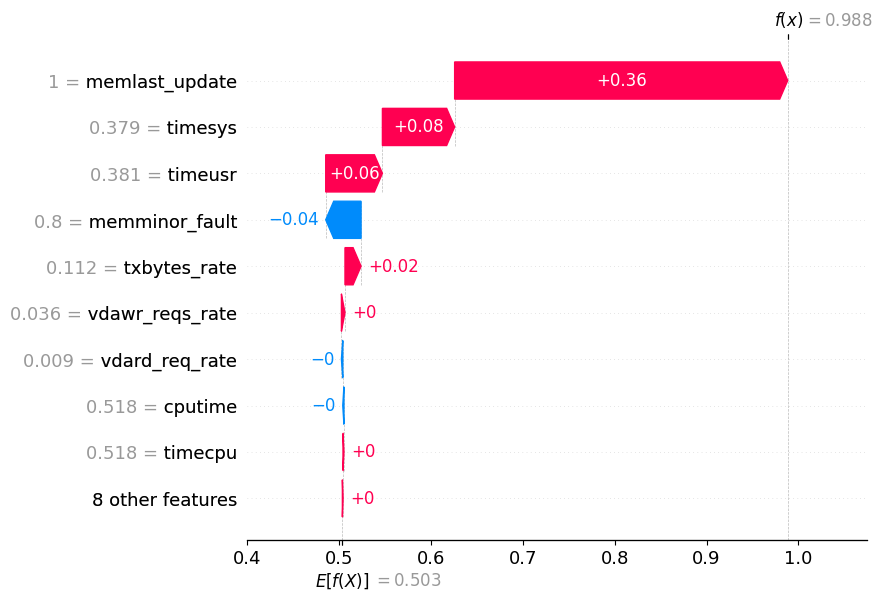

In [181]:
# Summarize the background data using k-means with K=100
K = 100  # Number of samples to use for background
background_data = shap.kmeans(X_train_scaled, K)  # Summarize background with k-means

# Initialize SHAP KernelExplainer with the summarized background data
explainer1 = shap.KernelExplainer(fnn_model.predict_proba, background_data)  # SHAP explainer for FFNN

# Generate SHAP values for the test set
shap_values = explainer1.shap_values(X_test_scaled_np)  # Pass the NumPy array

# Convert feature_names to a simple list if it's a Pandas Index
if isinstance(feature_names, pd.Index):
    feature_names = feature_names.tolist()

# Generate waterfall SHAP plots for specific instances
instance_indices = [1, 2, 1345]  # Indices of the instances to visualize
for idx in instance_indices:
    print(f"Generating waterfall plot for instance {idx}")

    # Select SHAP values for the desired class (e.g., class 1 - Attack)
    class_idx = 1  # Index of the class to visualize (0 for Normal, 1 for Attack)
    shap_values_for_class = shap_values[idx][:, class_idx]  # Select SHAP values for the class

    # Assuming explainer1.expected_value is a 1D array with shape (n_classes,)
    base_value = explainer1.expected_value[class_idx]

    shap.waterfall_plot(
        shap.Explanation(values=shap_values_for_class,  # Use SHAP values for the specific class
                         base_values=base_value,
                         data=X_test_scaled_np[idx],
                         feature_names=feature_names)
    )

367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
367/367 ━━━━━━━━

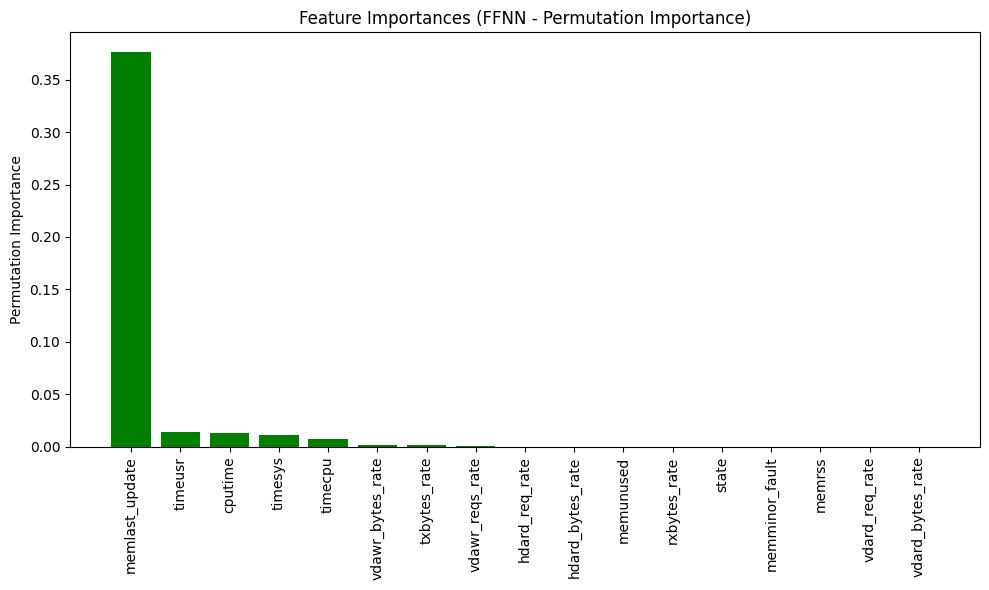

In [182]:
from sklearn.inspection import permutation_importance
import tensorflow as tf
from sklearn.metrics import accuracy_score # Import accuracy_score

# 2. Calculate permutation importance:
# Define a custom scoring function using accuracy_score
def custom_scoring_function(estimator, X, y):
    y_pred = estimator.predict(X)  # Assuming your model directly outputs probabilities
    y_pred_classes = (y_pred > 0.5).astype(int)  # Convert to classes
    return accuracy_score(y, y_pred_classes)

result = permutation_importance(
    ffnn_model,
    X_train_scaled,
    y_resampled,
    n_repeats=10,
    random_state=42,
    scoring=custom_scoring_function  # Pass the custom scoring function
)
importances = result.importances_mean

# 3. Sort feature importances:
indices = np.argsort(importances)[::-1]

# 4. Visualize feature importances:
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.title("Feature Importances (FFNN - Permutation Importance)")
plt.bar(range(X_train_scaled.shape[1]), importances[indices], align="center",color='green')
plt.xticks(range(X_train_scaled.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.ylabel("Permutation Importance")  # Add y-axis label
plt.tight_layout()
plt.show()

**7 COVOLUTIONAL NEURAL NETWORK IMPLEMENTATION (CNN)**


In [183]:
# Re-shaping the features to be feed in the CNN -model

X_train_scaled = X_train_scaled.values.reshape(-1, X_train_scaled.shape[1], 1) # Use .values to get the NumPy array before reshaping
X_test_scaled = X_test_scaled.values.reshape(-1, X_test_scaled.shape[1], 1)   # Use .values to get the NumPy array before reshaping

# Build the CNN model
cnn_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(50, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Conv1D(100, kernel_size=3, activation='relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
# Compile the model
cnn_model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
cnn_history=cnn_model.fit(X_train_scaled, y_resampled, batch_size = 32, epochs = 5)

Epoch 1/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9646 - loss: 0.1744
Epoch 2/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 1.0000 - loss: 9.4976e-04
Epoch 3/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9999 - loss: 4.3346e-04
Epoch 4/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 1.0000 - loss: 1.5615e-04
Epoch 5/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 1.0000 - loss: 1.6624e-04


**MODEL EVALUATION-CNN**

In [184]:
# model evaluation for using the test dataset for the feedfoward neural network
cnn_loss, cnn_accuracy = cnn_model.evaluate(X_test_scaled, y_test, verbose=0)
print ("Loss=%.4f" %cnn_loss)
print ("Accuracy=%.4f" %cnn_accuracy)

Loss=0.0000
Accuracy=1.0000


In [185]:
cnn_predictions = cnn_model.predict(X_test_scaled)

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [187]:
y_predcnn = (cnn_predictions > 0.5).astype(int)
report_cnn = classification_report(y_test, y_predcnn)
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1444
           1       1.00      1.00      1.00       478

    accuracy                           1.00      1922
   macro avg       1.00      1.00      1.00      1922
weighted avg       1.00      1.00      1.00      1922



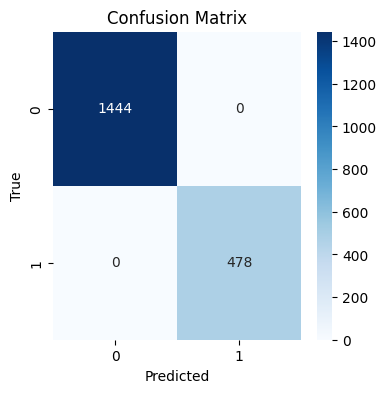

In [188]:
# Calculate confusion matrix
cnn_cm = confusion_matrix(y_test, y_predffnn)
# Plot confusion matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cnn_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

**8 RECURRENT NEURAL NETWORK IMPLEMENTATION (RNN)**

In [189]:
# Define the RNN Model
rnn_model = tf.keras.models.Sequential()

# Add LSTM layers
rnn_model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])))
rnn_model.add(tf.keras.layers.LSTM(units=100))  # Last LSTM layer without return_sequences
# Output layer for binary classification
rnn_model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Compile the model
rnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the RNN model
rnn_history=rnn_model.fit(X_train_scaled, y_resampled, batch_size=32, epochs=5)

Epoch 1/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.8205 - loss: 0.3303
Epoch 2/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - accuracy: 0.9792 - loss: 0.0811
Epoch 3/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - accuracy: 0.9851 - loss: 0.0654
Epoch 4/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.9881 - loss: 0.0502
Epoch 5/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - accuracy: 0.9964 - loss: 0.0204


In [190]:
# model evaluation for using the test dataset for the feedfoward neural network
rnn_loss, rnn_accuracy = rnn_model.evaluate(X_test_scaled, y_test, verbose=0)
print ("Loss=%.4f" %rnn_loss)
print ("Accuracy=%.4f" %rnn_accuracy)

Loss=0.0245
Accuracy=0.9948


In [191]:
rnn_predictions = rnn_model.predict(X_test_scaled)

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


In [192]:
y_predrnn = (rnn_predictions > 0.5).astype(int)
report_rnn = classification_report(y_test, y_predrnn)
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1444
           1       1.00      1.00      1.00       478

    accuracy                           1.00      1922
   macro avg       1.00      1.00      1.00      1922
weighted avg       1.00      1.00      1.00      1922



**9 LONG SHORT TERM MEMORY IMPLEMENTATION (LSTM)**

In [193]:
# Use directly X_train_scaled and X_test_scaled since they are already numpy arrays
X_train_reshaped = X_train_scaled.reshape(X_train_scaled.shape[0], 1, X_train_scaled.shape[1])
X_test_reshaped = X_test_scaled.reshape(X_test_scaled.shape[0], 1, X_test_scaled.shape[1])

# Define the LSTM Model
lstm_model = tf.keras.models.Sequential()

# First LSTM layer
lstm_model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))

# Output layer for binary classification with sigmoid activation
lstm_model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

# Compile the model
lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
lstm_history=lstm_model.fit(X_train_reshaped, y_resampled, batch_size=32, epochs=5, verbose=1)

Epoch 1/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.8511 - loss: 0.5004
Epoch 2/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9867 - loss: 0.0669
Epoch 3/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9909 - loss: 0.0340
Epoch 4/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9915 - loss: 0.0242
Epoch 5/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9934 - loss: 0.0156


In [194]:
# model evaluation for using the test dataset for the feedfoward neural network
lstm_loss,lstm_accuracy = lstm_model.evaluate(X_test_reshaped, y_test, verbose=0) #changed line, we are now using X_test_reshaped
print ("Loss=%.4f" %lstm_loss)
print ("Accuracy=%.4f" %lstm_accuracy)

Loss=0.0137
Accuracy=0.9938


In [195]:
lstm_predictions = lstm_model.predict(X_test_scaled.reshape(X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [196]:
y_pred_lstm = (lstm_predictions.reshape(-1) > 0.5).astype(int) # Reshape predictions and convert to 1D
report_lstm = classification_report(y_test, y_pred_lstm)
print(report_lstm)

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1444
           1       0.98      1.00      0.99       478

    accuracy                           0.99      1922
   macro avg       0.99      1.00      0.99      1922
weighted avg       0.99      0.99      0.99      1922



**10 AUTO ENCODER IMPLEMENTATION**

In [197]:
# Get the shape of the NumPy array
shape = X_train_scaled.shape

# Access individual dimensions using indexing
n_samples = shape[0]
n_features = shape[1]
n_time_steps = shape[2] # Get the third dimension

# Reshape the data for the ANN
X_train_reshaped = X_train_scaled.reshape(n_samples, n_features * n_time_steps) # Use n_features and n_time_steps to reshape

In [198]:
# BUILDING AN AUTO ENCODER
# Define parameters
input_dim = X_train_reshaped.shape[1]  # Input dimension
encoding_dim = 64  # Dimension of the encoding space
# Encoder structure
input_layer = layers.Input(shape=(input_dim,))
encoded = layers.Dense(encoding_dim, activation='relu')(input_layer)

# Decoder structure
decoded = layers.Dense(input_dim, activation='sigmoid')(encoded)

# Autoencoder model
autoencoder = models.Model(input_layer, decoded)

# Compile the autoencoder
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

In [94]:
autoencoder.fit(X_train_reshaped, X_train_reshaped,epochs=10,batch_size=32,  shuffle=True)

Epoch 1/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0754
Epoch 2/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0042
Epoch 3/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0023
Epoch 4/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0012
Epoch 5/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 9.1562e-04
Epoch 6/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.3541e-04
Epoch 7/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.5937e-04
Epoch 8/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 3.9442e-04
Epoch 9/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3871e-04
Epoch 10/10
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9467e-04


In [95]:
# Building an AUTO ENCODER Classification Model:
# Create encoder model
encoder = models.Model(input_layer, encoded)

# Classifier structure
classifier_input = layers.Input(shape=(encoding_dim,))
classifier_output = layers.Dense(1, activation='sigmoid')(classifier_input)  # For binary classification

classifier_en = models.Model(classifier_input, classifier_output)

# Compile the classifier
classifier_en.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [96]:
# Transform training data to the encoded space
X_train_encoded = encoder.predict(X_train_reshaped)

367/367 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [97]:
# Training the classifier
classifier_en.fit(X_train_encoded, y_resampled, epochs=5, batch_size=32)

Epoch 1/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8868 - loss: 0.4561
Epoch 2/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9838 - loss: 0.1441
Epoch 3/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9881 - loss: 0.0914
Epoch 4/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9878 - loss: 0.0728
Epoch 5/5
367/367 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9877 - loss: 0.0624


In [98]:
# Assuming X_test_scaled is the scaled testing data with shape (n_samples, n_features)
n_test_samples, n_features, n_time_steps = X_test_scaled.shape

# Since it's a DataFrame, there's no time_steps dimension, set it to 1
#n_time_steps = 1  # We got n_time_steps from .shape

# Reshape the test data to 2D (samples, features * time_steps)
# Remove .values since X_test_scaled is already a NumPy array
X_test_reshaped = X_test_scaled.reshape(n_test_samples, n_features * n_time_steps)

# Step 1: Encode the test data
X_test_encoded = encoder.predict(X_test_reshaped)

# Step 2: Evaluate the classifier
loss,aut_accuracy = classifier_en.evaluate(X_test_encoded, y_test)

print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {aut_accuracy * 100:.2f}%')

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9847 - loss: 0.0599
Test Loss: 0.0707
Test Accuracy: 98.07%


In [99]:
y_pred_probs_en = classifier_en.predict(X_test_encoded)
y_pred_en = (y_pred_probs_en > 0.5).astype(int)

61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [100]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred_en))  # Use y_pred_en instead of y_pred_probs_en

# Generate confusion matrix
print("\nConfusion Matrix:")
cm_en = confusion_matrix(y_test, y_pred_en)  # Use y_pred_en instead of y_pred_probs_en
print(cm_en)


Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.99      1444
           1       0.93      1.00      0.96       478

    accuracy                           0.98      1922
   macro avg       0.96      0.99      0.97      1922
weighted avg       0.98      0.98      0.98      1922


Confusion Matrix:
[[1407   37]
 [   0  478]]


**GRAPHICAL REPRESENTATION OF MODEL PERFORMANCES**

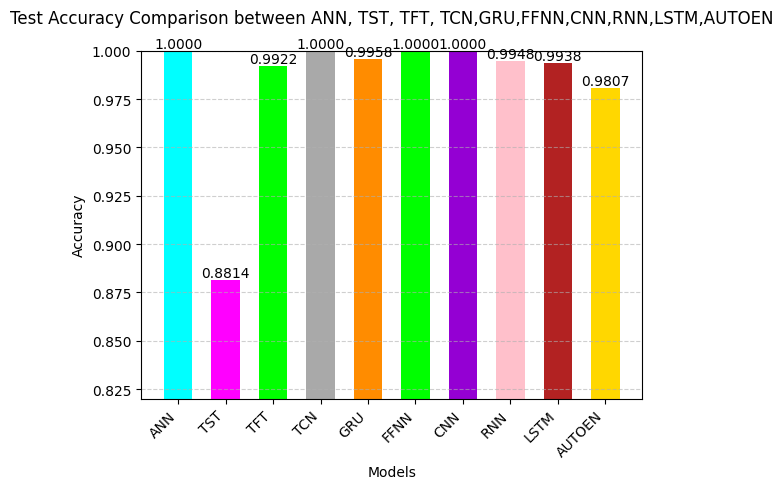

In [207]:
plt.figure(figsize=(6, 5))  # Increase figure size for better visualization

# Use plt.bar() for vertical bar chart
plt.bar(['ANN', 'TST', 'TFT', 'TCN','GRU','FFNN','CNN','RNN','LSTM','AUTOEN'], [ann_accuracy,tst_accuracy, tft_accuracy,tcn_accuracy, gru_accuracy, ffnn_accuracy, cnn_accuracy,rnn_accuracy,lstm_accuracy, aut_accuracy],
        color=['cyan', 'fuchsia', 'lime', 'darkgrey','darkorange', 'lime', 'darkviolet', 'pink','firebrick','gold'], width=0.6)  # Adjust width as needed

plt.xlabel('Models')  # Change xlabel to Models
plt.ylabel('Accuracy')  # Change ylabel to Accuracy
plt.title('Test Accuracy Comparison between ANN, TST, TFT, TCN,GRU,FFNN,CNN,RNN,LSTM,AUTOEN', pad=20)  # Add padding to the title


# Add accuracy values on top of the bars
for i, accuracy1 in enumerate([ann_accuracy,tst_accuracy, tft_accuracy,tcn_accuracy, gru_accuracy, ffnn_accuracy, cnn_accuracy,rnn_accuracy,lstm_accuracy, aut_accuracy]):
    plt.text(i, accuracy1, f'{accuracy1:.4f}', ha='center', va='bottom')  # Adjust text position

plt.ylim(0.82, 1.0)  # Set Y-axis limits to start from 0.9

plt.grid(axis='y', linestyle='--', alpha=0.6)  # Add grid for better readability
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

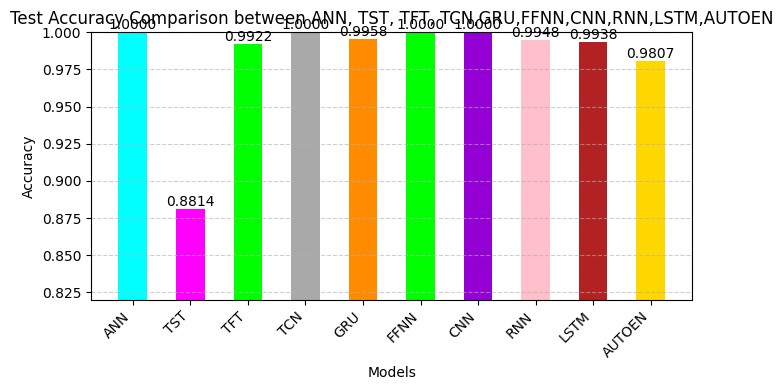

In [206]:
plt.figure(figsize=(7, 4))  # Increase figure size for better visualization

# Use plt.bar() for vertical bar chart
plt.bar(['ANN', 'TST', 'TFT', 'TCN','GRU','FFNN','CNN','RNN','LSTM','AUTOEN'], [ann_accuracy,tst_accuracy, tft_accuracy,tcn_accuracy, gru_accuracy, ffnn_accuracy, cnn_accuracy,rnn_accuracy,lstm_accuracy, aut_accuracy],
        color=['cyan', 'fuchsia', 'lime', 'darkgrey','darkorange', 'lime', 'darkviolet', 'pink','firebrick','gold'], width=0.5)  # Adjust width as needed

plt.xlabel('Models')  # Change xlabel to Models
plt.ylabel('Accuracy')  # Change ylabel to Accuracy
plt.title('Test Accuracy Comparison between ANN, TST, TFT, TCN,GRU,FFNN,CNN,RNN,LSTM,AUTOEN')

# Add accuracy values on top of the bars
for i, accuracy1 in enumerate([ann_accuracy,tst_accuracy, tft_accuracy,tcn_accuracy, gru_accuracy, ffnn_accuracy, cnn_accuracy,rnn_accuracy,lstm_accuracy, aut_accuracy]):
    plt.text(i, accuracy1, f'{accuracy1:.4f}', ha='center', va='bottom')  # Adjust text position

plt.ylim(0.82, 1.0)  # Set Y-axis limits to start from 0.9

plt.grid(axis='y', linestyle='--', alpha=0.6)  # Add grid for better readability
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

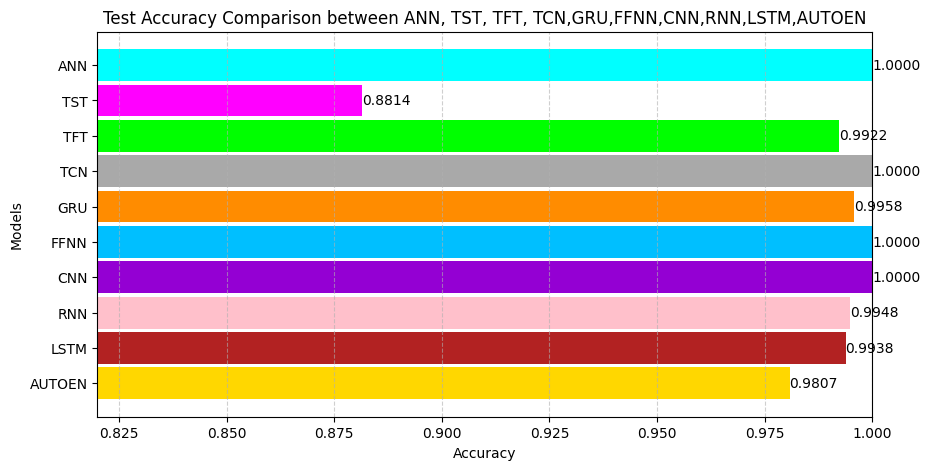

In [209]:
# Reverse the axes using a horizontal bar chart
plt.figure(figsize=(10, 5))  # Increase figure size for better visualization
plt.barh(['AUTOEN','LSTM','RNN','CNN','FFNN','GRU','TCN','TFT','TST','ANN' ], [aut_accuracy,lstm_accuracy,rnn_accuracy,cnn_accuracy,ffnn_accuracy,gru_accuracy,tcn_accuracy,tft_accuracy,tst_accuracy,ann_accuracy],
         color=['gold','firebrick','pink','darkviolet','deepskyblue','darkorange','darkgrey','lime', 'fuchsia','cyan'],height=0.9)

plt.xlabel('Accuracy')  # Change ylabel to xlabel
plt.ylabel('Models')  # Change xlabel to ylabel
plt.title('Test Accuracy Comparison between ANN, TST, TFT, TCN,GRU,FFNN,CNN,RNN,LSTM,AUTOEN')

# Add accuracy values next to the bars
for i, accuracy1 in enumerate([aut_accuracy,lstm_accuracy,rnn_accuracy,cnn_accuracy,ffnn_accuracy,gru_accuracy,tcn_accuracy,tft_accuracy,tst_accuracy,ann_accuracy]):
    plt.text(accuracy1, i, f'{accuracy1:.4f}', ha='left', va='center')

# Set X-axis limits to start from 0.9
plt.xlim(0.82, 1.0)

plt.grid(axis='x', linestyle='--', alpha=0.6)  # Add grid for better readability
plt.show()